# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 
***
The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
%matplotlib inline

import numpy as np
import cv2, glob, math, os
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# 1. Camera Calibration

- Setup the 3d-2d mapping by finding chessboard corners
- Calibration the camera
- Undistort an image

### Find corners of chessboard

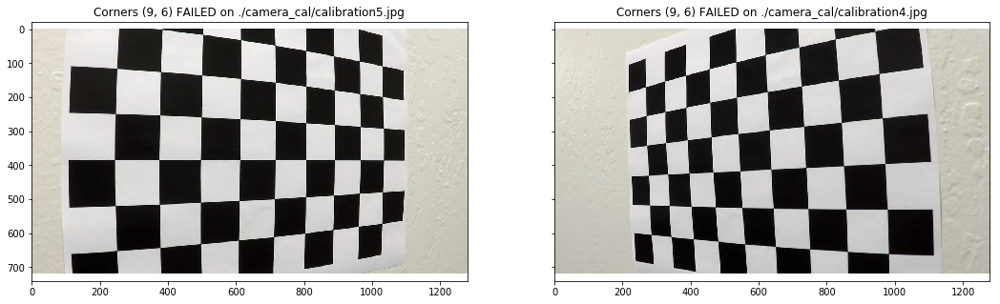

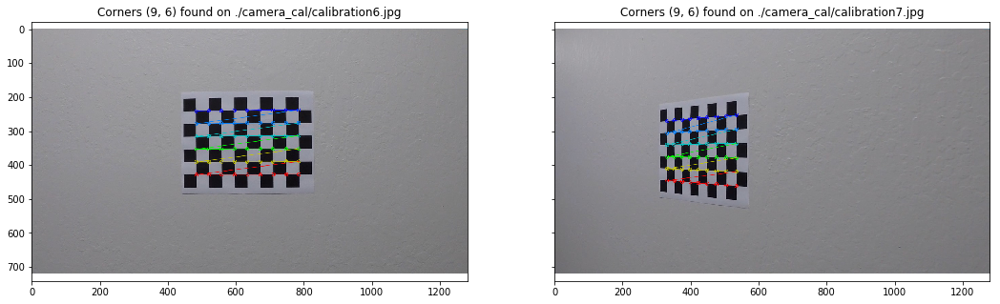

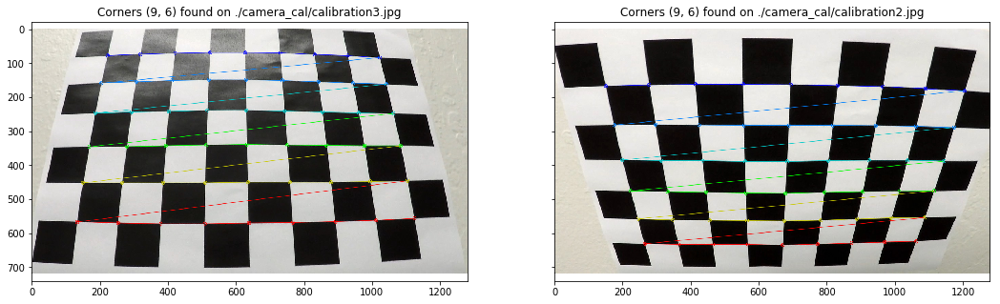

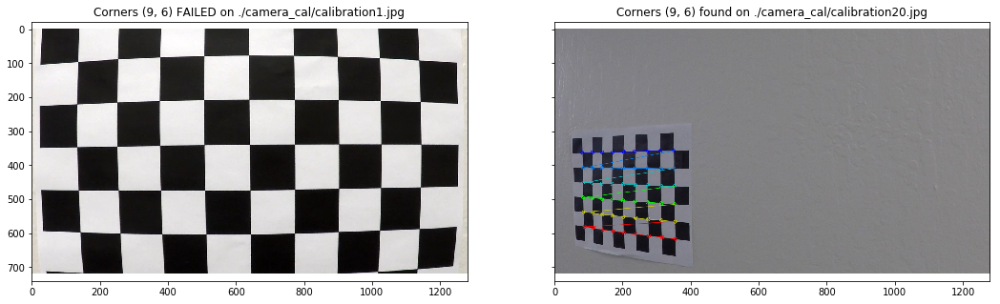

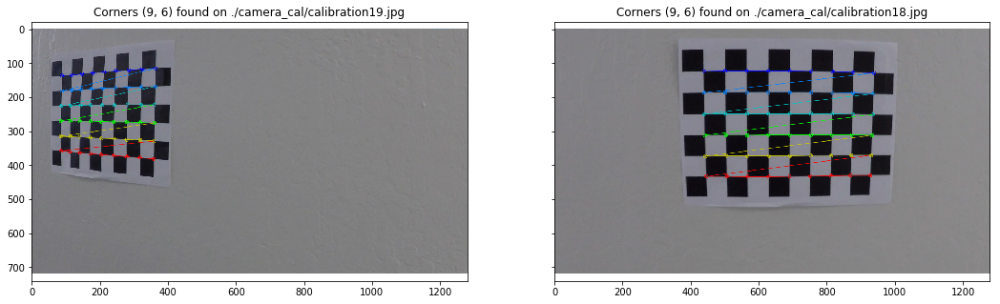

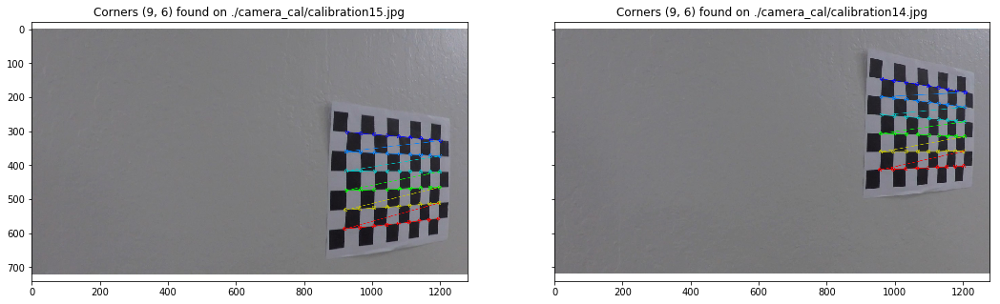

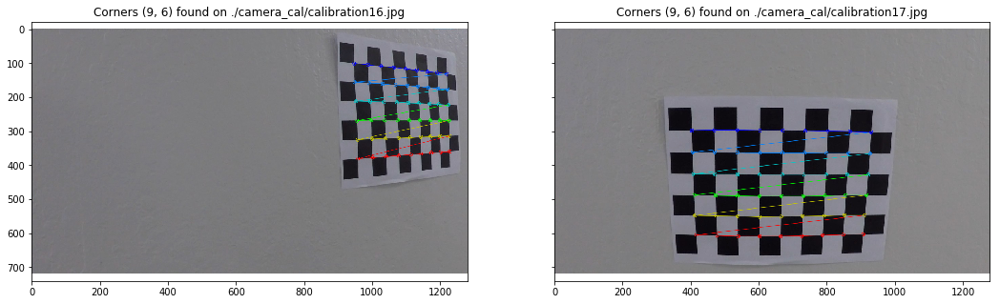

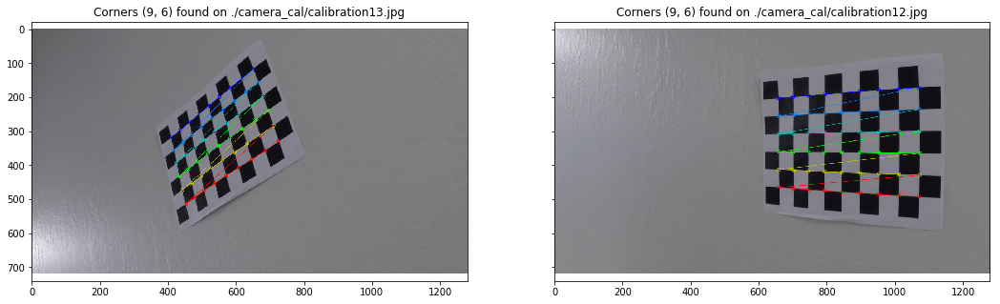

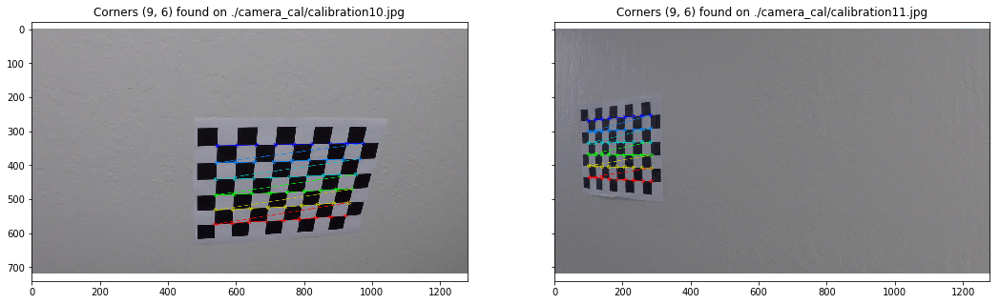

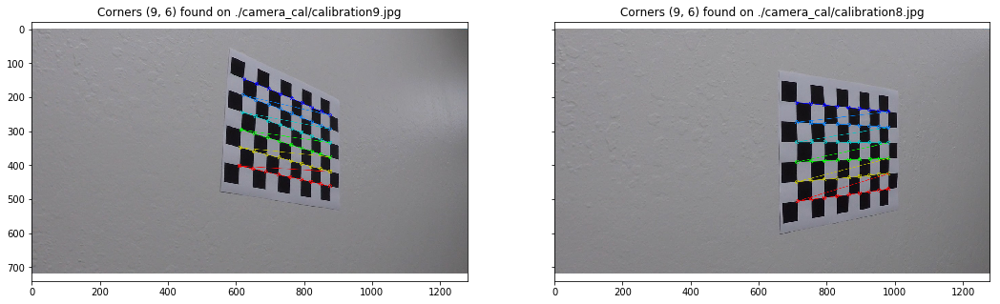

In [2]:
def find_corners_image(img, nx=9, ny=6, criteria=None):
    """ Find corners on an RGB chessboard image. """
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        # refine corners
        if criteria is not None:
            corners = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        return corners, img
    else:
        return None, img

def find_corners_images(img_files, nx=9, ny=6):
    """ Calibrate camera using calibration images. """
    
    # default number of inside points
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # termination criteria for corners refinement
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane
    
    def reset_plot():
        fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(18, 5))
        return fig, axes
    
    for i, fimg in enumerate(img_files):
        img = mpimg.imread(fimg)
        corners, img = find_corners_image(img, nx, ny, criteria)
        
        found = False
        if corners is not None:
            found = True
            objpoints.append(objp)
            imgpoints.append(corners)
        
        if i % 2 == 0:
            fig, axes = reset_plot()
        
        if found:
            axes[i % 2].set_title("Corners ({}, {}) found on {}".format(nx, ny, fimg))
        else:
            axes[i % 2].set_title("Corners ({}, {}) FAILED on {}".format(nx, ny, fimg))
        axes[i % 2].imshow(img)
        if i % 2 == 1:
            plt.show()
    
    return objpoints, imgpoints

objpoints, imgpoints = find_corners_images(glob.glob('./camera_cal/calibration*.jpg'))

### Observations

There are 3 failed images because the images do not contain enough inner corners. Next we shall treat them individually.

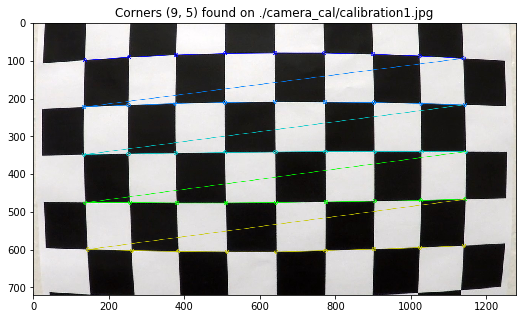

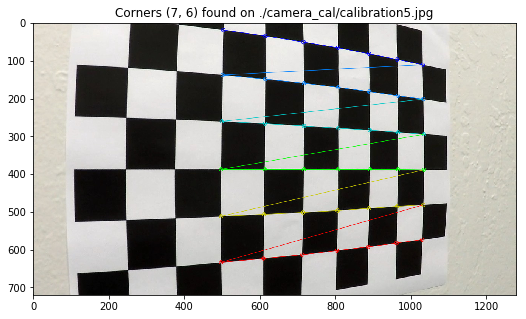

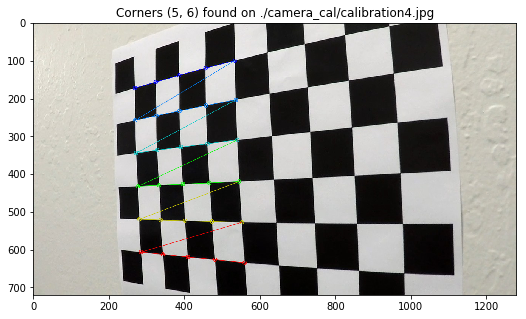

In [3]:
def find_append_corners(img_file, nx, ny, objpoints, imgpoints):
    """ Find corners of an image file and append corners to imgpoints. """
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    corners, img = find_corners_image(mpimg.imread(img_file), nx, ny, criteria)
    
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    if corners is not None:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        fig, ax = plt.subplots(figsize=(9,5))
        ax.imshow(img)
        ax.set_title("Corners ({}, {}) found on {}".format(nx, ny, img_file))
        plt.show()
    return


find_append_corners("./camera_cal/calibration1.jpg", 9, 5, objpoints, imgpoints)

find_append_corners("./camera_cal/calibration5.jpg", 7, 6, objpoints, imgpoints)

find_append_corners("./camera_cal/calibration4.jpg", 5, 6, objpoints, imgpoints)

### Calibration the camera

In [4]:
img_shape = mpimg.imread("./camera_cal/calibration1.jpg").shape[1::-1]

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape, None, None)

### Undistort an image

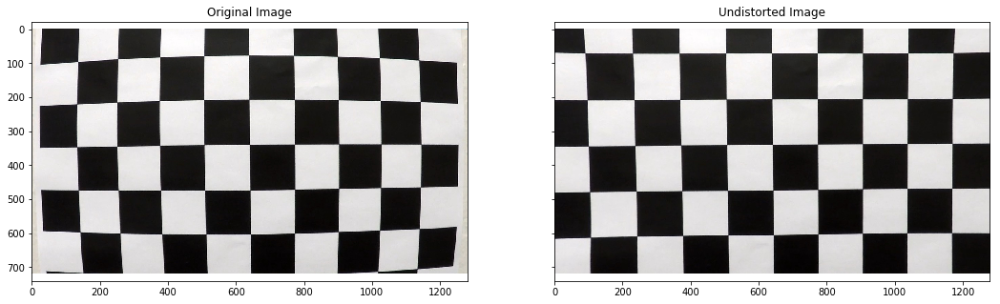

In [5]:
def undistort_image(img, mtx, dist, plot=False):
    """ Undistort an image.
    
    img -- a RGB image
    mtx -- camera matrix
    dist -- distortion coefficients
    
    Return: camera calibrated image
    """
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if plot:
        fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(18, 5))
        axes[0].imshow(img)
        axes[0].set_title('Original Image')
        axes[1].imshow(undist)
        axes[1].set_title('Undistorted Image')
        plt.show()
    
    return img, undist

def undistort_image_file(img_file, mtx, dist, plot=False):
    """ Undistort an image.
    
    img_file -- file name of the image
    mtx -- camera matrix
    dist -- distortion coefficients
    
    Return: camera calibrated image
    """
    
    img = mpimg.imread(img_file)
    
    return undistort_image(img, mtx, dist, plot)

img, undist = undistort_image_file("./camera_cal/calibration1.jpg", mtx, dist, True)

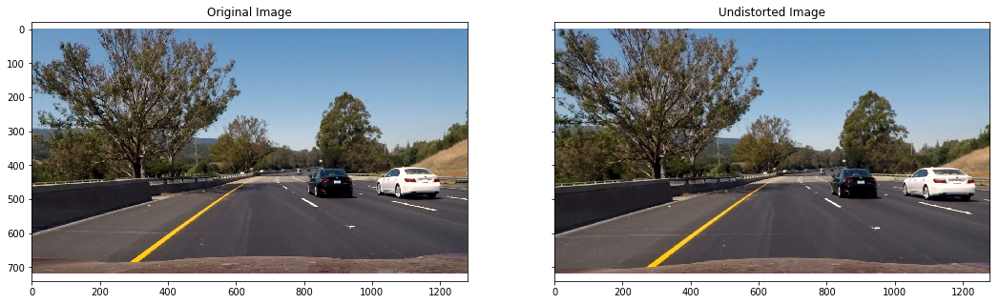

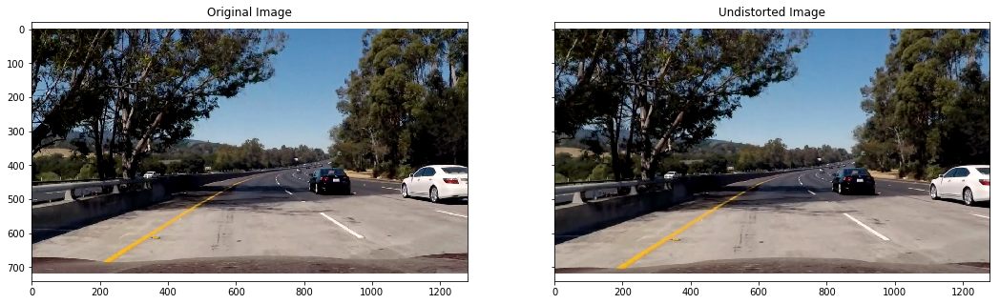

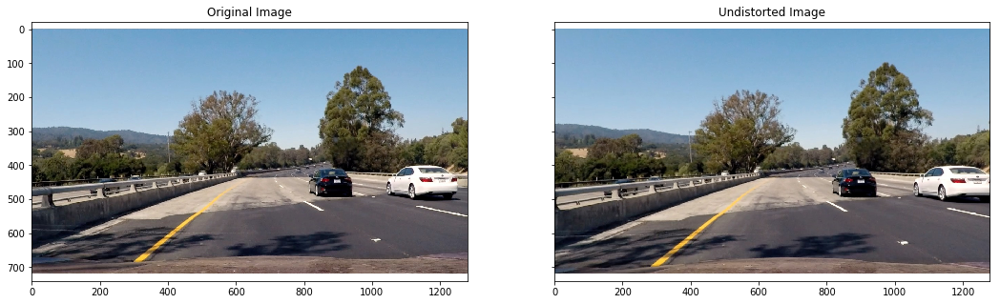

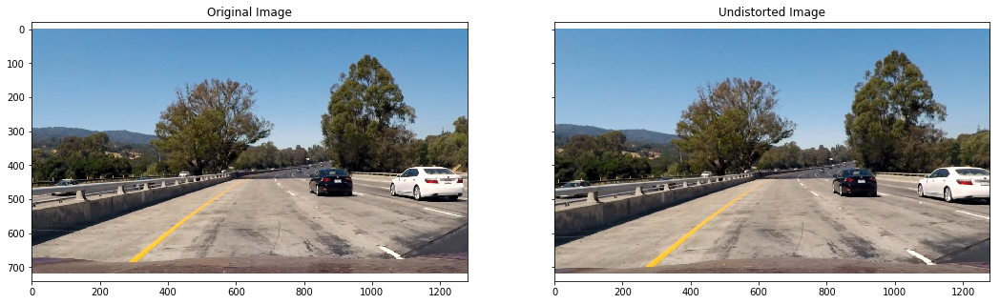

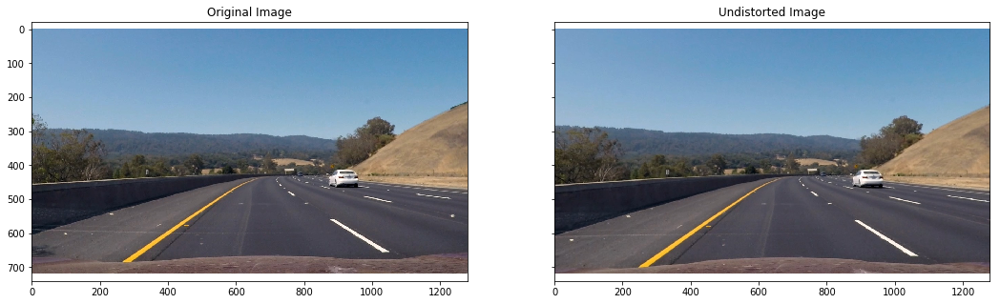

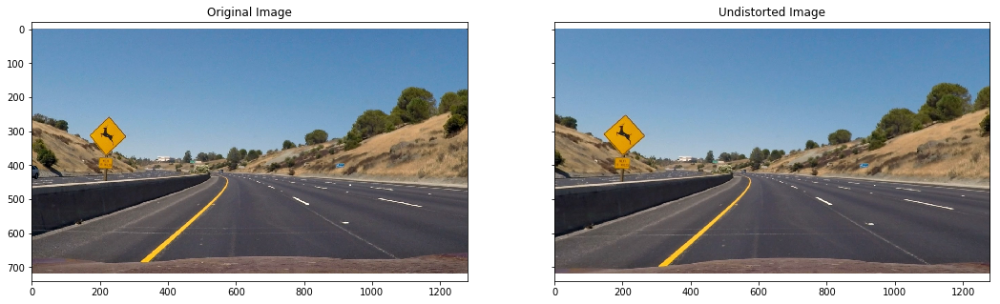

In [6]:
for img_file in glob.glob('./test_images/test*.jpg'):
    img, undist = undistort_image_file(img_file, mtx, dist, True)

# 2. Perspective Transform

- Compute the perspective transform, M, given source and destination points:
  
  `M = cv2.getPerspectiveTransform(src, dst)`


- Compute the inverse perspective transform:

  `Minv = cv2.getPerspectiveTransform(dst, src)`


- Warp an image using the perspective transform, M:

  `warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)`

To figure out the perspective transformer, we should test on a straightline image.

It seems to manually specify the source and destination matrices for warpping is tricky. Instead, I will use Canny edge detection and transform to Hough space to detect straight lines.

Once the expression of line is known, I will choose a trapezoid of the original image and warp it to bird-eye view.

In [7]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def linreg_Hough_lines(line_segs):
    # slope > 0: right lane, slope < 0: left lane
    # abs(slope) < 0.4 or abs(slope) > 1.0 will be considered as false detection
    
    lx, ly = np.array([]), np.array([])
    rx, ry = np.array([]), np.array([])
    
    for line in line_segs:
        for x1, y1, x2, y2 in line:
            m = (y2 - y1) / (x2 - x1)
            if abs(m) < 0.4 or abs(m) > 1.0:
                continue
            b = y1 - m * x1
            w = math.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2)
            
            px = np.linspace(x1, x2, int(w))
            py = m * px + b
            
            if m > 0: # right lane
                rx = np.append(rx, px)
                ry = np.append(ry, py)
            else:     # left lane
                lx = np.append(lx, px)
                ly = np.append(ly, py)
    
    if len(lx) == 0 or len(ly) == 0 or len(rx) == 0 or len(ry) == 0:
        return None, None
    
    # fit left and right lane to linear function
    lm, lb = np.polyfit(lx, ly, 1)
    l_func = np.poly1d([1 / lm, -lb / lm]) # takes y and returns x
    
    rm, rb = np.polyfit(rx, ry, 1)
    r_func = np.poly1d([1 / rm, -rb / rm]) # takes y and returns x
    
    return l_func, r_func

def find_lane(img):
    
    # step 1: Gaussian blur the grayscale image to remove noise for Canny edge detection
    # variables: kernal_size of Gaussian blur (number of neighboring points)
    kernel_size = 5
    gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blur_gray = cv2.GaussianBlur(gray_image, (kernel_size, kernel_size), 0)

    # step 2: Canny edge detection
    # variables: high, low thresholds for edge detection
    # (> high: edge, < low: not edge, > low and < high: edge if connects to points > high)
    low_threshold  = 50
    high_threshold = 150
    edges = cv2.Canny(blur_gray, low_threshold, high_threshold)

    # step 3: mask the image to the front lanes
    imshape = img.shape
    vertices = np.array([[(100,imshape[0]),
                          (0.45*imshape[1], 0.55*imshape[0]),
                          (0.55*imshape[1], 0.55*imshape[0]),
                          (imshape[1]-100,imshape[0])]], dtype=np.int32)
    masked_edges = region_of_interest(img=edges, vertices=vertices)

    # step 3: probabilistic Hough transform to find line shape
    # variables: rho, theta, threshold, min_line_length, max_line_gap
    rho = 1              # resolution of rho in pixels
    theta = np.pi/180    # resolution of theta in radians
    threshold = 15       # minimum number of intersections to “detect” a line
    min_line_len = 15    # minimum number of points that can form a line
    max_line_gap = 100   # maximum gap between two points to be considered in the same line
    lines = cv2.HoughLinesP(masked_edges, rho, theta, threshold, np.array([]),
                            minLineLength=min_line_len, maxLineGap=max_line_gap)
    
    return linreg_Hough_lines(lines)

### Determine source matrix

[(237.78009515449355, 705), (1085.1335939020369, 705), (703.49347136415804, 460), (578.8783339447026, 460)]


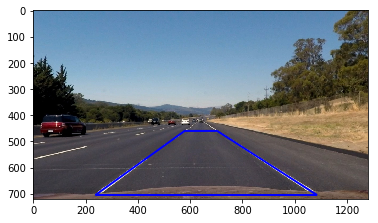

In [8]:
# average two straightlines

img, undist = undistort_image_file("./test_images/straight_lines1.jpg", mtx, dist, False)
l_func0, r_func0 = find_lane(undist)

img, undist = undistort_image_file("./test_images/straight_lines2.jpg", mtx, dist, False)
l_func1, r_func1 = find_lane(undist)


y = [705, 705, 460, 460]
x0 = [l_func0(y[0]), r_func0(y[1]), r_func0(y[2]), l_func0(y[3])]
x1 = [l_func1(y[0]), r_func1(y[1]), r_func1(y[2]), l_func1(y[3])]

# yellow line is not well considered in the above lane detection, thus a smaller weight
x = [0.3 * i + 0.7 * j for i, j in zip(x0, x1)]
# some tweak of the bottom left corner
x[0] += 5

xy = list(zip(x,y))
print (xy)

fig, ax = plt.subplots()
ax.imshow(undist)
ax.add_patch(patches.Polygon(xy=xy, fill=False, linewidth=2, color='b'))
plt.show()

In [9]:
def warp(img, src, dst, plot=False):
    
    # perspective transformer and inverse transformer
    M = cv2.getPerspectiveTransform(src, dst)
    
    # warp image
    warped = cv2.warpPerspective(img, M, img_shape, flags=cv2.INTER_LINEAR)
    
    if plot:
        fig, axes = plt.subplots(ncols=2, nrows=1, sharex=True, sharey=True, figsize=(18, 5))
        
        axes[0].imshow(img)
        axes[0].add_patch(patches.Polygon(xy=src, fill=False, linewidth=2, color='r'))
        axes[0].set_title("Unwarpped Image")
        
        axes[1].imshow(warped)
        axes[1].add_patch(patches.Polygon(xy=dst, fill=False, linewidth=2, color='r'))
        axes[1].set_title("Warpped Image")
        
        plt.show()
    
    return warped

### Determine destination matrix

In [37]:
width, height = img_shape
offset = 310

src = np.float32(xy)
dst = np.float32([(offset, height), (width-offset, height), (width-offset, 0), (offset, 0)])
print (dst)

[[ 310.  720.]
 [ 970.  720.]
 [ 970.    0.]
 [ 310.    0.]]


Also test other images using the same source and destination matrices.

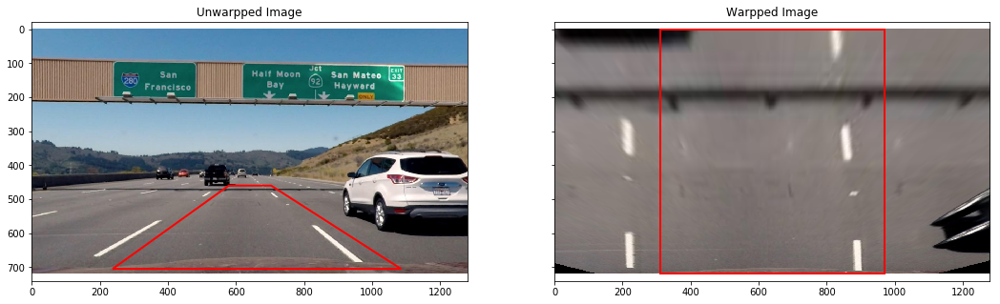

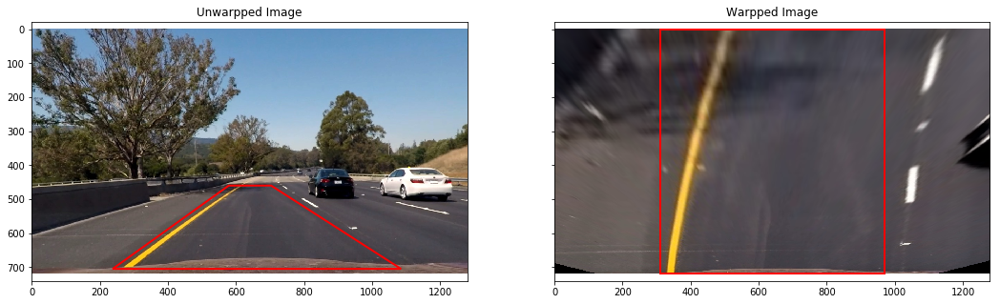

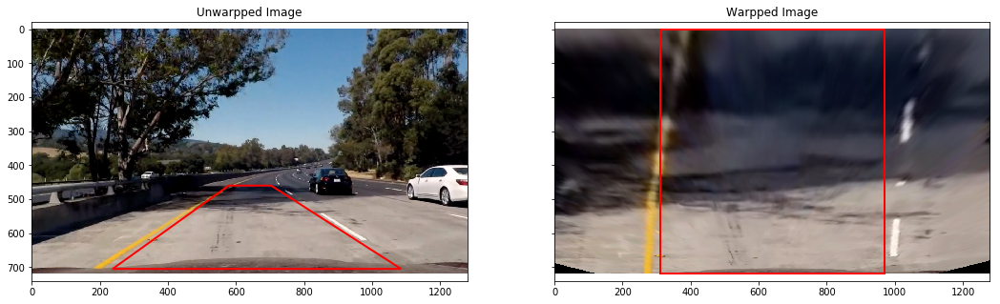

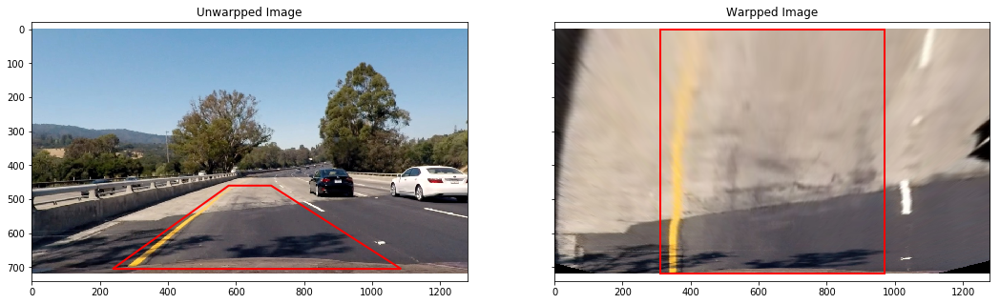

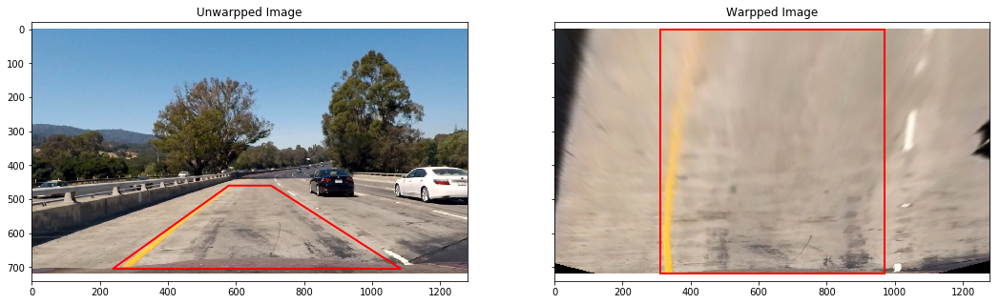

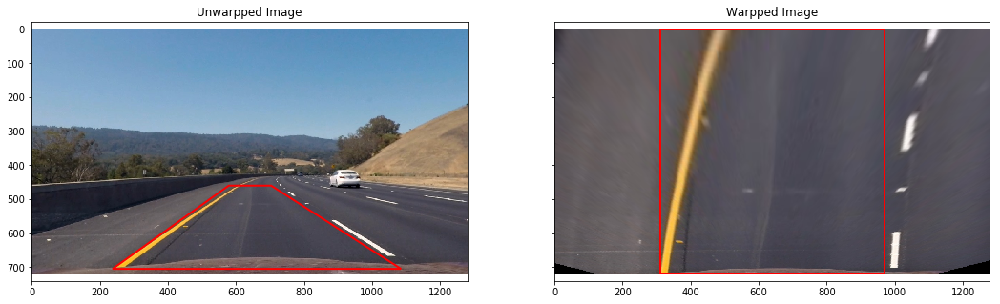

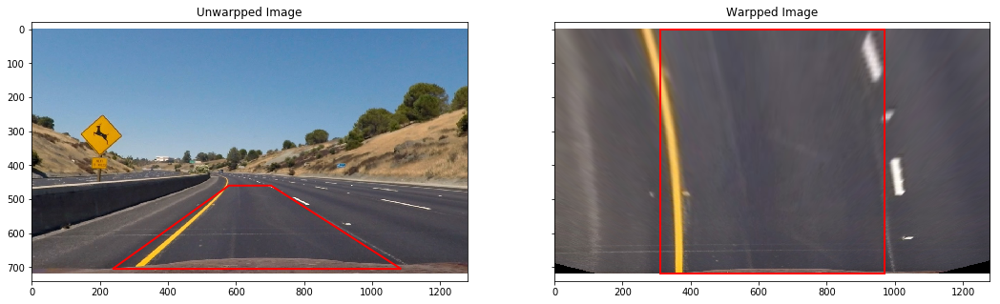

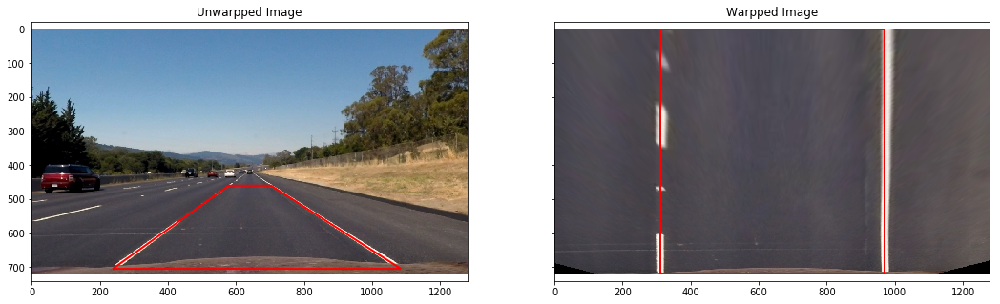

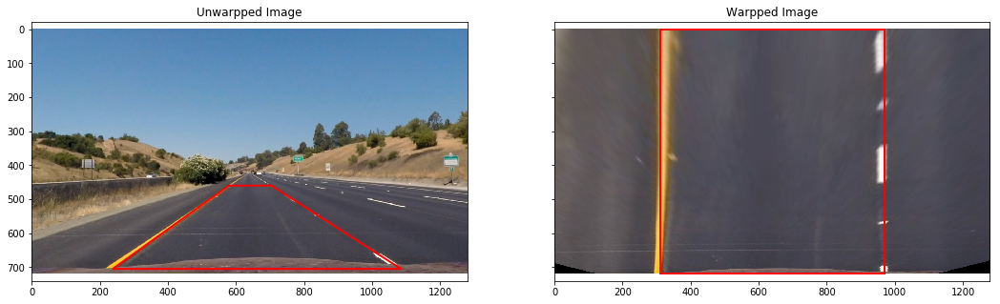

In [11]:
for img_file in glob.glob('./test_images/*.jpg'):
    img, undist = undistort_image_file(img_file, mtx, dist, False)
    warped = warp(undist, src, dst, True)

# 3. Create Binary Image

- Sobel filter: absolute threshold, gradient magnitude, gradient direction
- Color spaces: HSV/HSL, different color channels

### Sobel filter

In [12]:
def sobel_filter_single(img_gray, sobel_kernel=3, x_thresh=(0, 255), y_thresh=(0, 255),
                        mag_thresh=(0, 255), dir_thresh=(0, np.pi/2), gaussian_kernel=7):
    """ Apply Sobel filter and return a mask that matches the thresholds. """
    
    gray = cv2.GaussianBlur(img_gray, (gaussian_kernel, gaussian_kernel), 0)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    sobelx = np.abs(sobelx)
    sobely = np.abs(sobely)
    
    # directional gradient
    scaled_sobelx = np.uint8(255 * sobelx / np.max(sobelx))
    scaled_sobely = np.uint8(255 * sobely / np.max(sobely))
    
    gradx = np.zeros_like(scaled_sobelx)
    gradx[(scaled_sobelx >= x_thresh[0]) & (scaled_sobelx <= x_thresh[1])] = 1
    
    grady = np.zeros_like(scaled_sobely)
    grady[(scaled_sobely >= y_thresh[0]) & (scaled_sobely <= y_thresh[1])] = 1
    
    # gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    gradmag = (255 * gradmag / np.max(gradmag)).astype(np.uint8) 
    
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    # gradient direction
    absgraddir = np.arctan2(sobely, sobelx)
    
    dir_binary = np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    
    # combine these four thresholds
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

def sobel_filter(img, sobel_kernel=3, x_thresh=(0, 255), y_thresh=(0, 255),
                 mag_thresh=(0, 255), dir_thresh=(0, np.pi/2), gaussian_kernel=7):
    """ Apply Sobel filter and return a mask that matches the thresholds. """
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return sobel_filter_single(gray, sobel_kernel, x_thresh, y_thresh,
                               mag_thresh, dir_thresh, gaussian_kernel)

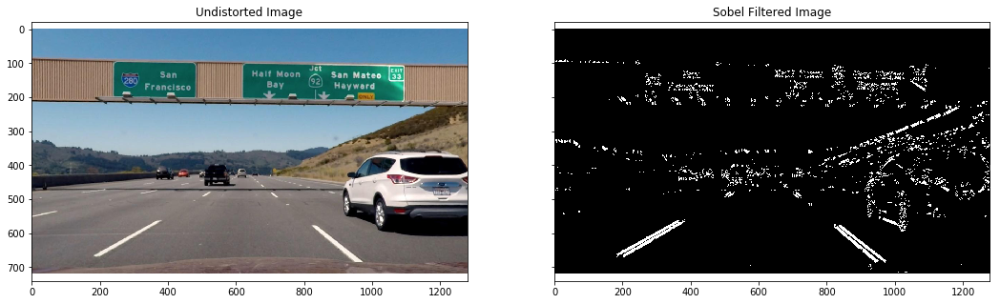

In [13]:
# test on a calibrated image
img, undist = undistort_image_file("./test_images/signs_vehicles_xygrad.jpg", mtx, dist, False)

fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(18,5))

axes[0].imshow(undist)
axes[0].set_title("Undistorted Image")

binary = sobel_filter(undist, 15, x_thresh=(20,100), y_thresh=(20,30),
                      mag_thresh=(30,145), dir_thresh=(0.75,1.25))
axes[1].imshow(binary, cmap='gray')
axes[1].set_title("Sobel Filtered Image")
plt.show()

### Color space

In [14]:
def plot_channels_thresh(img, channel_names):
    """ Plot a 3-channel image separately if pixels fall in thresholds. """
    
    if img.shape[-1] != 3 or len(channel_names) != 3:
        raise ValueError("Number of color channels must be 3!")
    
    fig, axes = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(18,3.3))
    
    for i in range(3):
        b = img[:, :, i]
        
        axes[i].imshow(b, cmap='gray')
        axes[i].set_title("Channel {}".format(channel_names[i]))
    plt.show()

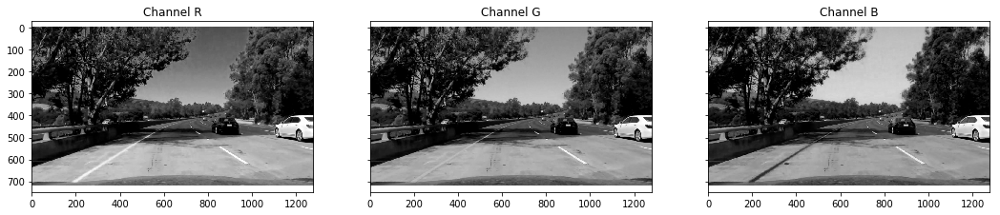

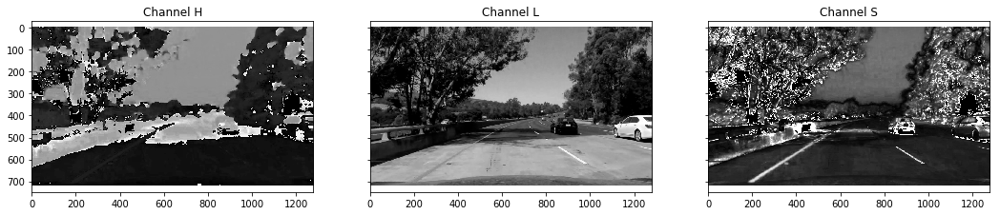

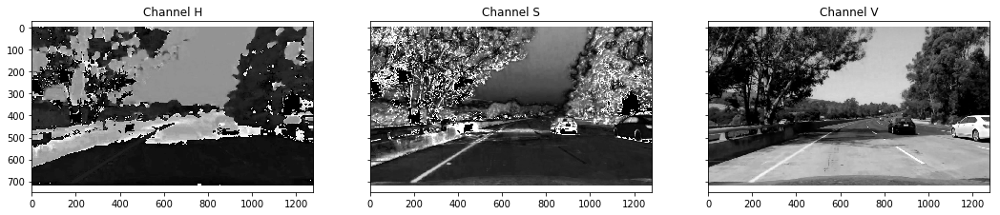

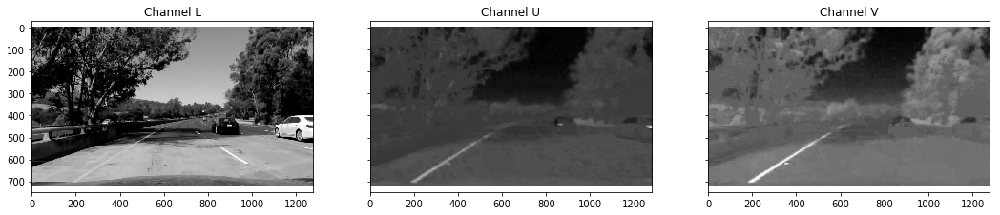

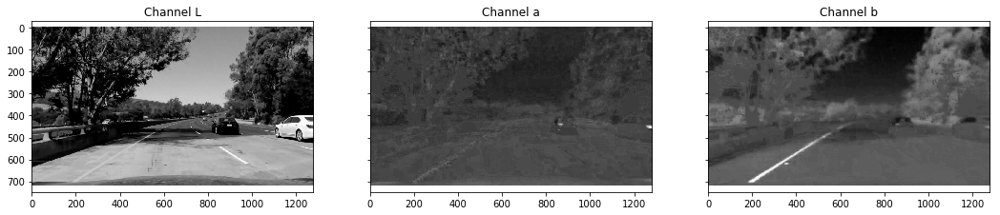

In [15]:
# test on a calibrated image
img1, undist1 = undistort_image_file("./test_images/test5.jpg", mtx, dist, False)

# RGB
plot_channels_thresh(undist1, "RGB")

# HLS
hls = cv2.cvtColor(undist1, cv2.COLOR_RGB2HLS)
plot_channels_thresh(hls, "HLS")

# HSV
hsv = cv2.cvtColor(undist1, cv2.COLOR_RGB2HSV)
plot_channels_thresh(hsv, "HSV")

# LUV
lab = cv2.cvtColor(undist1, cv2.COLOR_RGB2LUV)
plot_channels_thresh(lab, "LUV")

# Lab
lab = cv2.cvtColor(undist1, cv2.COLOR_RGB2Lab)
plot_channels_thresh(lab, "Lab")

### Observations

Each color space has one channel that performs fairly well:
- RGB: R
- HLS: S
- HSV: V
- Lab, LUV: L

Among the above choices, the R channel of RGB and S or H channels of HLS are most promising because we want the detection independent on various lightness conditions.

In [16]:
def hls_select(img, thresh=(0, 255), channel=2):
    """ Apply thresholds on the channel of an RGB image transformed to HLS. """
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:, :, channel]
    
    binary = np.zeros_like(s)
    binary[(s >= thresh[0]) & (s <= thresh[1])] = 1
    return binary

def plot_hls_thresh(img, thresh=(0,255), channel=2):
    """ Plot the original RGB image and S channel of thresholded HLS image. """
    
    name = "HLS"
    b = hls_select(img, thresh, channel)
    
    fig, (ax0, ax1) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(18,5))
    
    ax0.imshow(img)
    ax0.set_title("Orignal Image")
    
    ax1.imshow(b, cmap='gray')
    ax1.set_title('Thresholded {}'.format(name[channel]))
    
    plt.show()

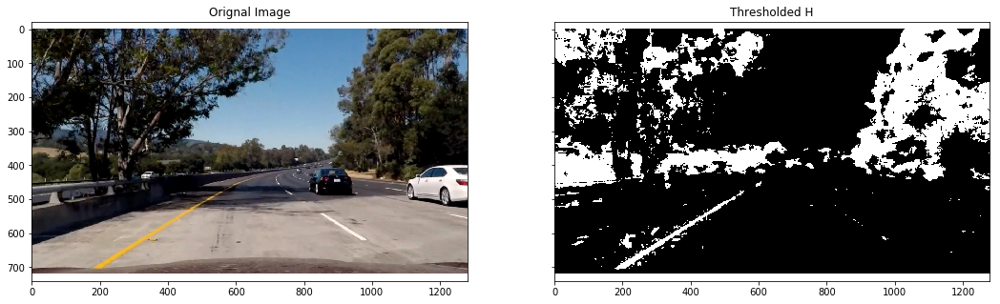

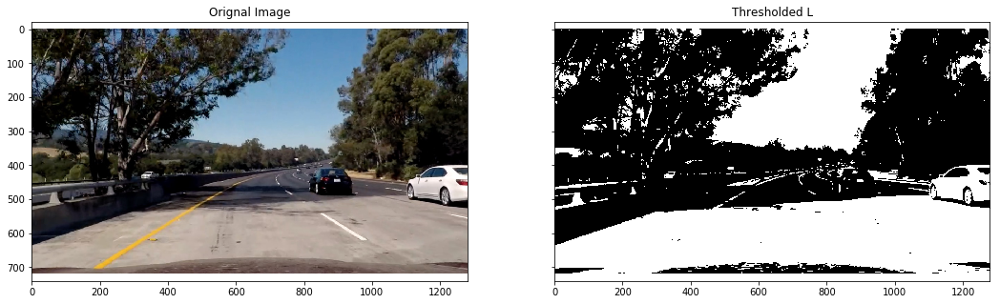

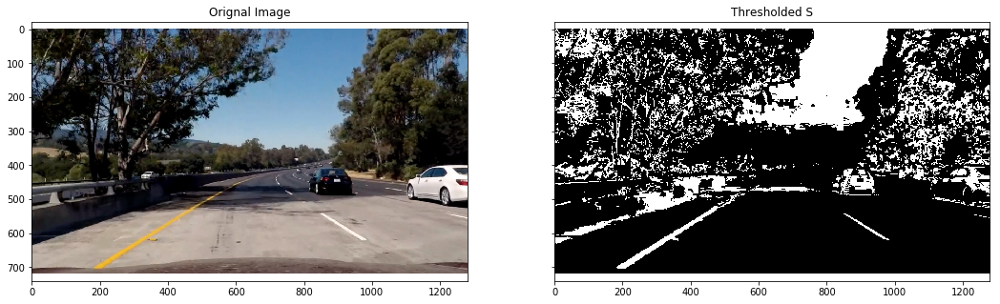

In [17]:
# test on calibrated images
tmin, tmax = 17.5, 50
plot_hls_thresh(undist1, thresh=(tmin, tmax), channel=0)

tmin, tmax = 100, 255
plot_hls_thresh(undist1, thresh=(tmin, tmax), channel=1)

tmin, tmax = 100, 255
plot_hls_thresh(undist1, thresh=(tmin, tmax), channel=2)

### Combine Sobel filter and color spaces

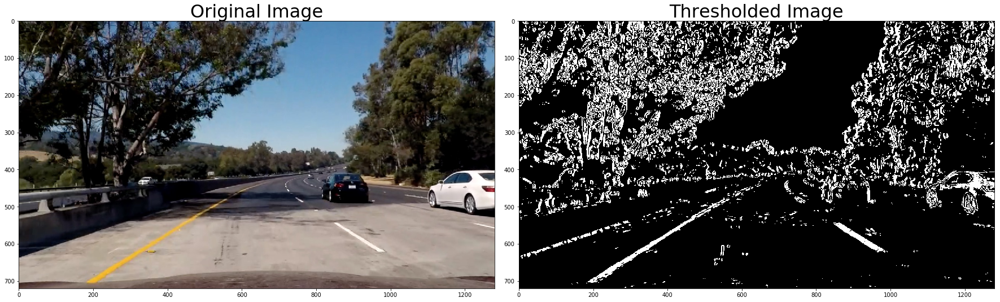

In [18]:
def create_binary_image(img, sobel_kernel=15, x_thresh=(30,150), y_thresh=(0,30),
                        mag_thresh=(25,150), dir_thresh=(0.8,1.3), gaussian_kernel=3,
                        color_thresh=(140, 255)):
    """ Generate a binary image by applying thresholded Sobel filter and color space transformation. """
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel filter
    sobel_binary = sobel_filter_single(l_channel, sobel_kernel, x_thresh, y_thresh,
                                       mag_thresh, dir_thresh, gaussian_kernel)
    
    # Color space
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= color_thresh[0]) & (s_channel <= color_thresh[1])] = 1
    
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= color_thresh[0]) & (l_channel <= color_thresh[1])] = 1
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(sobel_binary == 1) | ( (s_binary == 1) & (l_binary == 1) ) ] = 1
    
    return combined_binary

# test
result = create_binary_image(undist1)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(undist1)
ax1.set_title('Original Image', fontsize=32)

ax2.imshow(result, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=32)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# 4. Create Pipeline for Binary Image

In [19]:
def pipeline(img, mtx, dist, src, dst, plot=False,
             sobel_kernel=15, x_thresh=(30,150), y_thresh=(0,100),
             mag_thresh=(20,150), dir_thresh=(0.8,1.3), gaussian_kernel=3, color_thresh=(175, 255)):
    
    """ Pipeline for generating a binary image from a RGB image. """
    
    # undistort image from file
    img, undist = undistort_image(img, mtx, dist)
    
    # warp image
    warped = warp(undist, src, dst)
    
    # binary image
    binary = create_binary_image(warped)
    
    if plot:
        fig, (ax0, ax1, ax2) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(18,3.3))
        
        ax0.imshow(undist)
        ax0.add_patch(patches.Polygon(xy=src, fill=False, linewidth=2, color='r'))
        ax0.set_title("Undistorted Image")
        
        ax1.imshow(warped)
        ax1.add_patch(patches.Polygon(xy=dst, fill=False, linewidth=2, color='r'))
        ax1.set_title("Undistorted Warped Image")
        
        ax2.imshow(binary, cmap='gray')
        ax2.add_patch(patches.Polygon(xy=dst, fill=False, linewidth=2, color='r'))
        ax2.set_title("Binary Undistorted Warped Image")
        
        plt.show()
    
    return binary, undist
    
#     # binary image
#     binary = create_binary_image(undist)
    
#     # warp image
#     warped = warp(binary, src, dst)
    
#     if plot:
#         fig, (ax0, ax1, ax2) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(18,3.3))
        
#         ax0.imshow(undist)
#         ax0.add_patch(patches.Polygon(xy=src, fill=False, linewidth=2, color='r'))
#         ax0.set_title("Undistorted Image")
        
#         ax1.imshow(binary, cmap='gray')
#         ax1.add_patch(patches.Polygon(xy=src, fill=False, linewidth=2, color='r'))
#         ax1.set_title("Undistorted Binary Image")
        
#         ax2.imshow(warped, cmap='gray')
#         ax2.add_patch(patches.Polygon(xy=dst, fill=False, linewidth=2, color='r'))
#         ax2.set_title("Binary Undistorted Warped Image")
        
#         plt.show()
    
#     return warped

def pipeline_file(img_file, mtx, dist, src, dst, plot=False,
             sobel_kernel=15, x_thresh=(30,150), y_thresh=(0,100),
             mag_thresh=(20,150), dir_thresh=(0.8,1.3), gaussian_kernel=3, color_thresh=(175, 255)):
    
    """ Pipeline for generating a binary image from file. """
    
    # read image from file
    img = mpimg.imread(img_file)
    
    return pipeline(img, mtx, dist, src, dst, plot,
                    sobel_kernel, x_thresh, y_thresh, mag_thresh, dir_thresh, gaussian_kernel,
                    color_thresh)

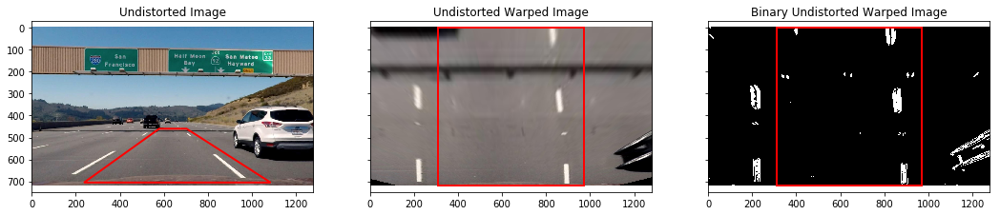

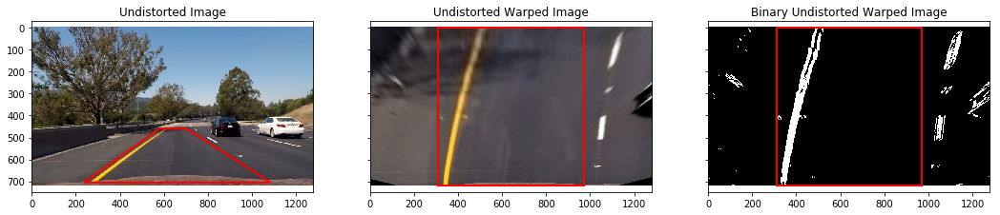

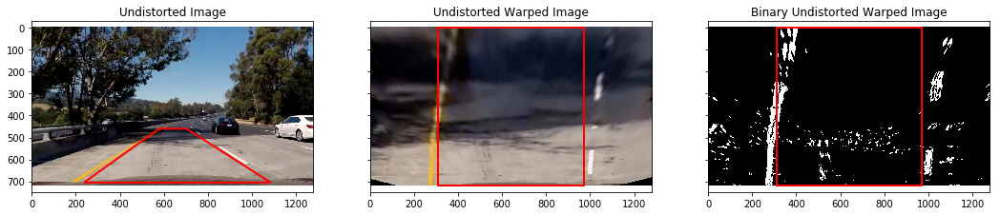

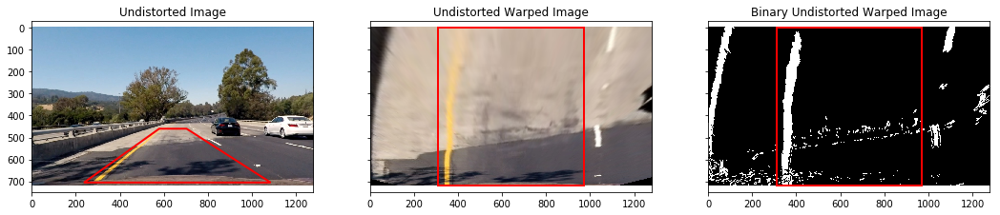

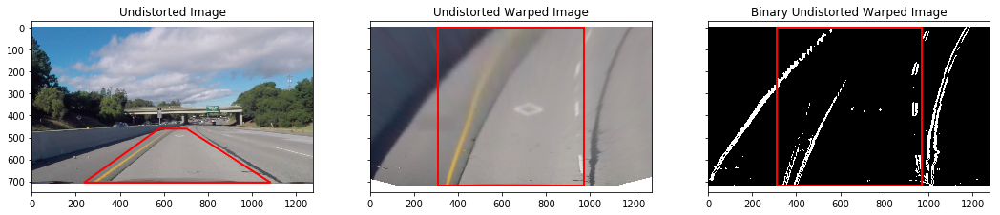

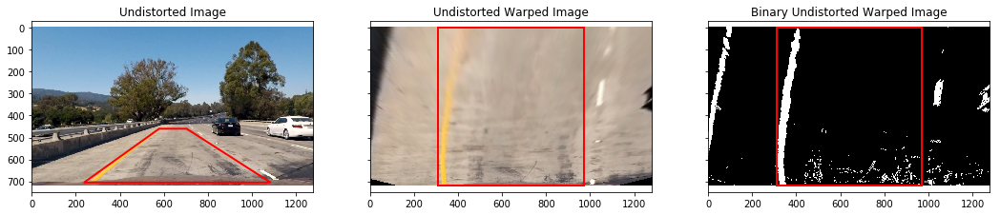

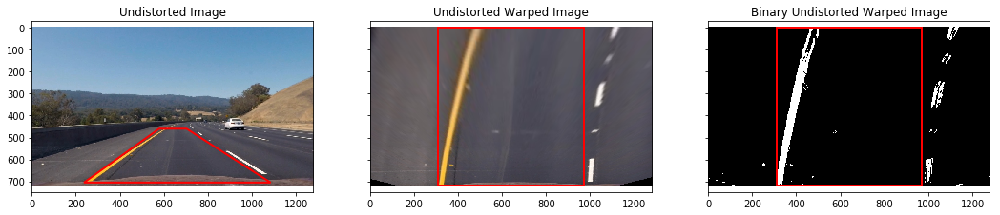

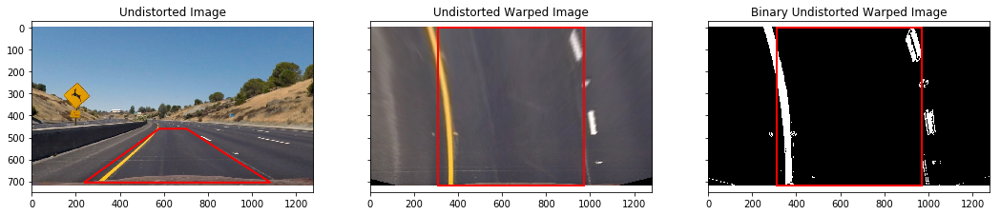

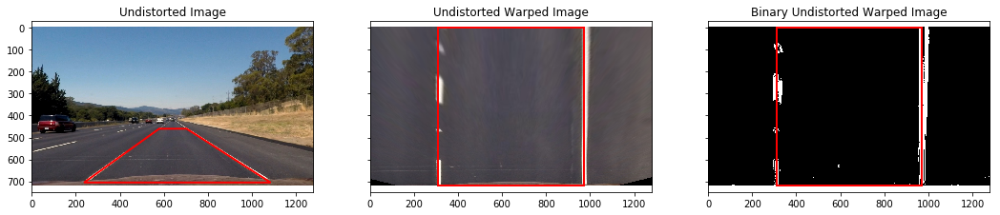

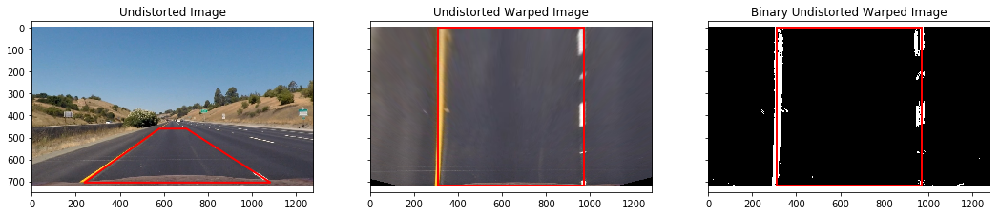

In [36]:
for img_file in glob.glob('./test_images/*.jpg'):
    result, undist = pipeline_file(img_file, mtx, dist, src, dst, True)

# 5. Find Lanes and Fit a Polynomial

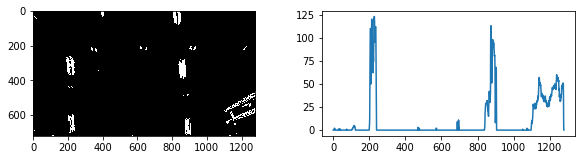

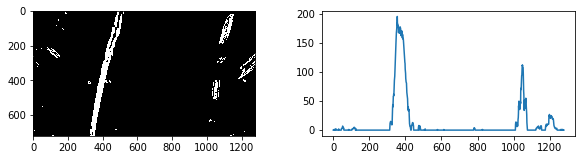

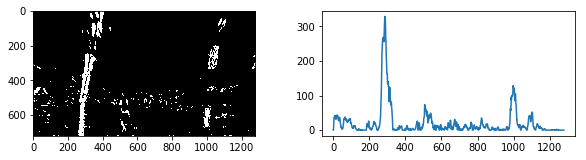

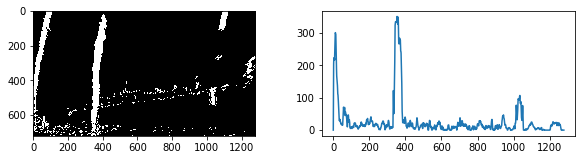

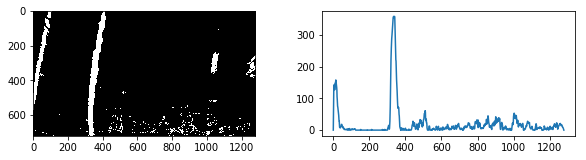

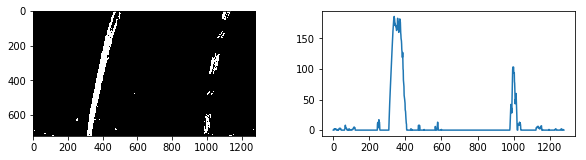

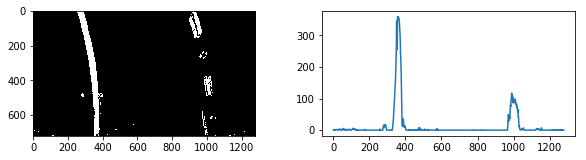

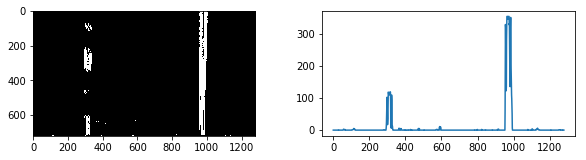

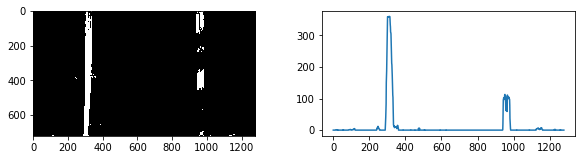

In [21]:
# bottom half peaks
for img_file in glob.glob('./test_images/*.jpg'):
    result, undist = pipeline_file(img_file, mtx, dist, src, dst, False)
    histogram = np.sum(result[result.shape[0]//2:,:], axis=0)
    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,2.3))
    ax0.imshow(result, cmap='gray')
    ax1.plot(histogram)
    plt.show()

In [38]:
def quadratic(fit, x):
    """ Return the value of fit[0] * x**2 + fit[1] * x + fit[0]. """
    a2, a1, a0 = fit
    return a2 * (x ** 2) + a1 * x + a0

def sliding_window_fit(binary_warped, nwindows=9, margin=80, minpix=50, plot=True, offset=50):
    """ Sliding windows and fit to a quadratic polynomial.
    
    binary_warped -- warped binary image
    nwindows -- number of sliding windows
    margin -- margin of the window: window width = 2 * margin
    minpix -- minimum number of pixels found to recenter window
    plot -- plot the windows
    """
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped)) * 255)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[offset:midpoint])
    rightx_base = np.argmax(histogram[midpoint:-offset]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
                      (0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
                      (0,255,0), 3) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    if plot:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
        left_fitx = quadratic(left_fit, ploty)
        right_fitx = quadratic(right_fit, ploty)

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
        fig, ax = plt.subplots(figsize=(6, 3.3))
        ax.imshow(out_img)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
        ax.set_xlim(0, 1280)
        ax.set_ylim(720, 0)
        plt.show()
    
    return left_fit, right_fit

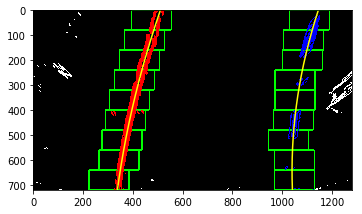

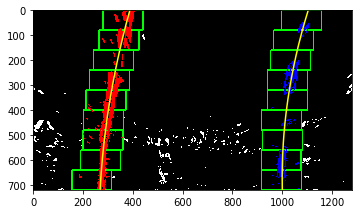

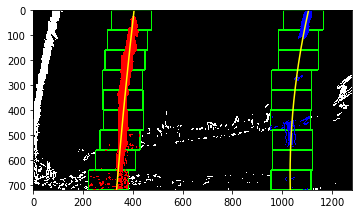

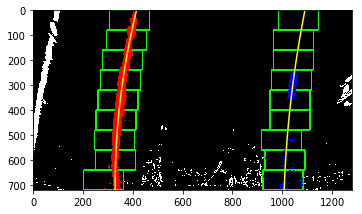

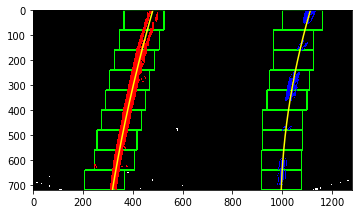

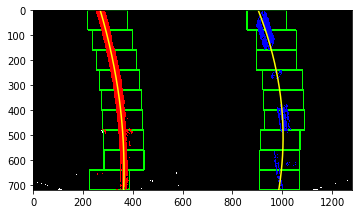

In [39]:
for img_file in glob.glob('./test_images/test*.jpg'):
    result, undist = pipeline_file(img_file, mtx, dist, src, dst, False)
    sliding_window_fit(result)

In [24]:
def sliding_window_fit_refine(binary_warped, left_fit, right_fit, margin=50, plot=True):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Identify the nonzero pixels in x and y within the window
    center = quadratic(left_fit, nonzeroy)
    left_lane_inds = ((nonzerox > (center - margin)) & (nonzerox < (center + margin)))
    
    center = quadratic(right_fit, nonzeroy)
    right_lane_inds = ((nonzerox > (center - margin)) & (nonzerox < (center + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    if plot:
        # Generate x and y values for plotting
        ploty = np.linspace( 0, binary_warped.shape[0] - 1, binary_warped.shape[0] )
        left_fitx = quadratic(left_fit, ploty)
        right_fitx = quadratic(right_fit, ploty)

        # Create an image to draw on and an image to show the selection window
        out_img = np.uint8( 255 * np.dstack((binary_warped, binary_warped, binary_warped)) )
        window_img = np.zeros_like(out_img)
        
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255,0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        
        fig, ax = plt.subplots(figsize=(6, 3.3))
        ax.imshow(out_img)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
        ax.set_xlim(0, 1280)
        ax.set_ylim(720, 0)
    
    return left_fit, right_fit

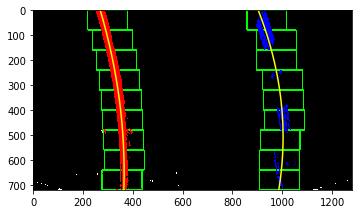

[ -2.35092334e-04   3.01938257e-01   2.69112407e+02] [ -3.92318647e-04   3.94412340e-01   9.03806184e+02]


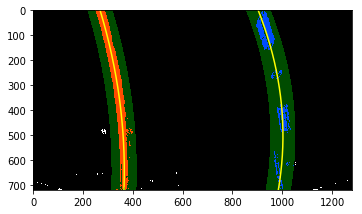

In [25]:
left_fit, right_fit = sliding_window_fit(result)
left_fit, right_fit = sliding_window_fit_refine(result, left_fit, right_fit)
print (left_fit, right_fit)

# 6. Measure and Draw Curvature

In [26]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30. / 720 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700 # meters per pixel in x dimension

def quadratic_curvature(quadratic_func, x0):
    """ Compute the curvature of a quadratic function at point x0. """
    
    a2, a1, a0 = quadratic_func
    return ( (1.0 + (2 * a2 * x0 + a1) ** 2) ** 1.5 ) / np.abs(2 * a2)

def compute_curvatures(left_fit, right_fit, img_shape=(720,1280)):
    """ Compute the curvatures of left and right lanes in meters. """
    
    height, width = img_shape
    
    # meters off from center
    center_off = 0.5 * (quadratic(left_fit, height//2) + quadratic(right_fit, height//2)) - width / 2
    center_off = np.abs(center_off * xm_per_pix)
    
    ploty = np.linspace(0, height - 1, height)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, quadratic(left_fit, ploty) * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, quadratic(right_fit, ploty) * xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    y_eval = int(0.85 * height) * ym_per_pix
    left_curverad = quadratic_curvature(left_fit_cr, y_eval)
    right_curverad = quadratic_curvature(right_fit_cr, y_eval)
    
    return (left_curverad, right_curverad, center_off)

In [27]:
out_curve = compute_curvatures(left_fit, right_fit)
print (out_curve)

(698.56605645523325, 418.67982281894433, 0.16462976212537103)


In [28]:
def draw_curvature(img, binary_warped, left_fit, right_fit, src, dst, out_curve, plot=True):
    """ Draw curvature on orignal undistorted (camera calibrated) image. """
    
    # Inverse perspective transformer
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = quadratic(left_fit, ploty)
    right_fitx = quadratic(right_fit, ploty)
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    out_img = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    # Add radius messages
    left_curverad, right_curverad, center_off = out_curve
    text = "Left radius: {:.1f} m".format(left_curverad)
    cv2.putText(out_img, text, (10, 60), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0,0,0), 2, cv2.LINE_AA)
    text = "Right radius: {:.1f} m".format(right_curverad)
    cv2.putText(out_img, text, (10, 120), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0,0,0), 2, cv2.LINE_AA)
    text = "{:+.2f} m off center".format(center_off)
    cv2.putText(out_img, text, (10, 180), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0,0,0), 2, cv2.LINE_AA)
    
    # Plot
    if plot:
        fig, ax = plt.subplots(figsize=(6, 3.3))
        ax.imshow(out_img)
        plt.show()

    return out_img

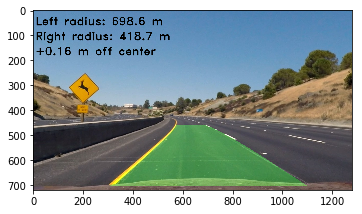

In [29]:
out_img = draw_curvature(undist, result, left_fit, right_fit, src, dst, out_curve)

# 7. Wrapup

- Define a Line class to track various data
- Create the full pipeline

In [30]:
class Line(object):
    def __init__(self):
        # number of frames
        self.count = 0
        
        # was the line detected in the last iteration?
        self.detected = False
        
#         # x values of the last n fits of the line
#         self.recent_xfitted = []
        
#         # average x values of the fitted line over the last n iterations
#         self.bestx = None
        
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.zeros(3) for i in range(15)]
        
        # radius of curvature of the line in meters
        self.radius_of_curvature = None
        
#         # distance in meters of vehicle center from the line
#         self.line_base_pos = None
        
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        
#         # x values for detected line pixels
#         self.allx = None
        
#         # y values for detected line pixels
#         self.ally = None
        
    def update(self, fit, curverad):
        if fit is not None:
            if self.best_fit is None:
                self.detected = True
                self.radius_of_curvature = curverad
                
                self.best_fit = fit
                self.current_fit[self.count % 15] = fit
                
                self.count += 1
            else:
                fit0 = self.current_fit[(self.count - 1) % 15]
                diff = np.abs(fit - fit0)
                vdiff = np.abs(quadratic(fit, height) - quadratic(fit0, height))
                if diff[0] < 1.0e-3 and diff[1] < 1.0 and vdiff < 15:
                    self.detected = True
                    self.radius_of_curvature = curverad

                    self.current_fit[self.count % 15] = fit
                    self.best_fit = np.average(self.current_fit, axis=0)

                    self.count += 1
        else:
            self.detected = False

In [31]:
left_lane, right_lane = Line(), Line()
left_fit, right_fit = None, None

def process_image(img):
    """ The pipeline from a RGB image to final image with curvature drawn. """
    
    global left_lane, right_lane, left_fit, right_fit
    
    # binary image
    binary_warped, undist = pipeline(img, mtx, dist, src, dst, False)
    
    # sliding window fit
    if left_lane.detected == False or right_lane.detected == False or left_lane.current_fit[-1][0] == 0.0:
        left_fit, right_fit = sliding_window_fit(binary_warped, plot=False)
    else:
        left_fit, right_fit = sliding_window_fit_refine(binary_warped, left_fit, right_fit, plot=False)
    
    # compute curvature
    out_curve = compute_curvatures(left_fit, right_fit)
    left_curverad, right_curverad, center_off = out_curve
    
    # update data of left and right lanes
    left_lane.update(left_fit, left_curverad)
    right_lane.update(right_fit, right_curverad)
    
    return draw_curvature(undist, binary_warped, left_fit, right_fit, src, dst, out_curve, plot=False)

In [32]:
try:
    os.mkdir("test_videos_output")
except:
    pass

def generate_video(filename):
    
    output = 'test_videos_output/{}'.format(filename)

    clip1 = VideoFileClip(filename)

    out_clip = clip1.fl_image(process_image)

    %time out_clip.write_videofile(output, audio=False)

In [33]:
left_lane, right_lane = Line(), Line()
left_fit, right_fit = None, None
generate_video("project_video.mp4")

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [05:44<00:00,  2.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 5min 9s, sys: 1min 17s, total: 6min 27s
Wall time: 5min 46s


In [34]:
# left_lane, right_lane = Line(), Line()
# left_fit, right_fit = None, None
# generate_video("challenge_video.mp4")

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


100%|██████████| 485/485 [02:08<00:00,  3.76it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video.mp4 

CPU times: user 1min 57s, sys: 27.6 s, total: 2min 25s
Wall time: 2min 10s


In [39]:
# left_lane, right_lane = Line(), Line()
# left_fit, right_fit = None, None
# generate_video("harder_challenge_video.mp4")

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [05:44<00:00,  3.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/harder_challenge_video.mp4 

CPU times: user 5min 5s, sys: 1min 16s, total: 6min 21s
Wall time: 5min 46s
